# Bluebook for Bulldozers

## Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv(
    '../data/processed/data-wrangling.csv',
    low_memory=False
)

In [3]:
df.head(3)

,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,fiModelDesc,...,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls,saleYear,saleMonth,saleDate,saleDayOfWeek,saleDayOfYear
0,1646770,9500.0,1126363,8434,132,18.0,1974,NaN,NaN,TD20,...,None or Unspecified,Straight,None or Unspecified,NaN,NaN,1989,1,17,1,17
1,1821514,14000.0,1194089,10150,132,99.0,1980,NaN,NaN,A66,...,NaN,NaN,NaN,Standard,Conventional,1989,1,31,1,31
2,1505138,50000.0,1473654,4139,132,99.0,1978,NaN,NaN,D7G,...,None or Unspecified,Straight,None or Unspecified,NaN,NaN,1989,1,31,1,31


### Feature correlation

<AxesSubplot:>

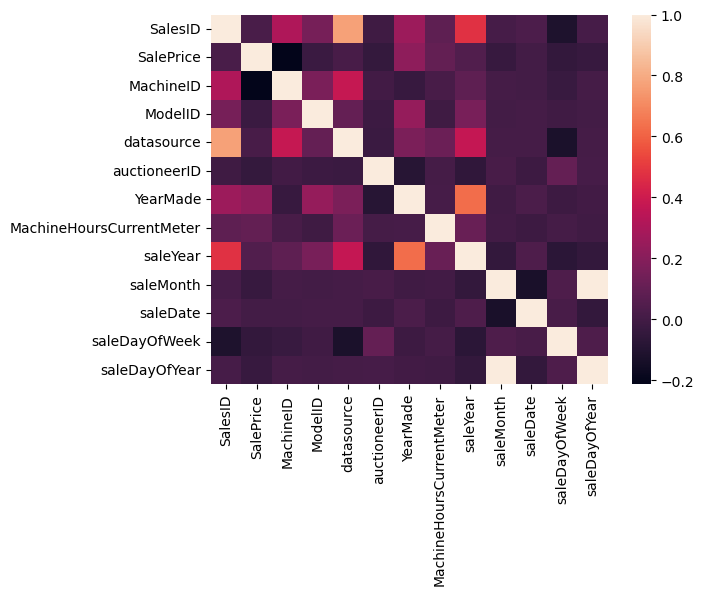

In [4]:
sns.heatmap(df.corr())

Noticing mild correlation between `YearMade` and our target variable, `SalePrice`, which is expected, as newer vehicles generally command a higher price.

Also, noticing strong correlation between `SalesID` and `datasource`, although that doesn't reveal any interesting trends about this dataset, as these are categorical values that do not describe the vehicle.

### Remove duplicate rows

In [5]:
df.shape[0]

372915

In [6]:
df.drop_duplicates(inplace=True)
df.shape[0]

372915

Looks like there were no duplicate rows.  

### Understanding unique categorical values

In [7]:
# Get the list of column names in your DataFrame
categorical_columns = df.select_dtypes(include='object').columns

# Iterate over each categorical column
for column in categorical_columns:
    unique_values = df[column].unique()  # Get the unique values for the current column
    print(f"Unique values in {column}: {unique_values}")

Unique values in UsageBand: [nan 'Low' 'Medium' 'High']
Unique values in fiModelDesc: ['TD20' 'A66' 'D7G' ... 'GD650AW-2C' 'TLK750' '710VHP']
Unique values in fiBaseModel: ['TD20' 'A66' 'D7' ... 'WLK15' 'SE200' 'TLK750']
Unique values in fiSecondaryDesc: [nan 'G' 'B' 'C' 'H' 'F' 'D' 'E' 'M' 'K' 'Z' 'A' 'L' 'N' 'P' 'WD' 'S' 'CE'
 'LC' 'CL' 'SX' 'CKB' 'EX' 'UU' 'SUPER L' 'URG' 'BEC' 'HDSL' 'ZF' 'PX'
 'SE' 'SU' 'T' 'W' 'TX' 'LCM' 'AG' 'LS' 'AX' 'R' 'SL' 'ESS' 'J' 'UR' 'LE'
 'XT' 'LCH' '3' 'JX' 'US' 'V' 'U' 'TM' 'SUPER K' 'DZ' 'EL' 'SRLC' 'SR'
 'ZTS' 'HD' 'BL' 'DX' 'USR' 'SUPER E' 'MR' 'XL' 'SG' 'SP' 'SB' 'MU' 'CR'
 'NX' 'SUPER M' 'FR' 'CH' 'ZX' 'SXT' 'AW' 'NE' 'Q' 'MRX' 'TTL' 'LR' 'HF'
 'GT' 'DXT' '0.7' 'HDS' 'PT' '7' 'NL' 'CS' 'ZHS' 'EW' 'R-2' 'LX' 'DT' 'ZT'
 'STD' 'AA' '-7' 'SRDZ' 'HL' '1' 'LGP' 'ZTM' 'H90' 'IV' 'B     ' 'XLT'
 'SUPER' 'MXT' 'TP' 'LT' '-3' 'MT' 'BZ' 'BLGP' 'WT' 'HLGP' 'BZD' 'BLGPPS'
 'SUPER M PLUS' 'WX' 'PS' 'MSR SPIN ACE' '2' 'LCD' 'PTC' 'THF' 'HZ' '-2'
 'ZHS G' ' MSR 

Unique values in Coupler_System: [nan 'None or Unspecified' 'Yes']
Unique values in Grouser_Tracks: [nan 'None or Unspecified' 'Yes']
Unique values in Hydraulics_Flow: [nan 'Standard' 'High Flow' 'None or Unspecified']
Unique values in Track_Type: [nan 'Steel' 'Rubber']
Unique values in Undercarriage_Pad_Width: [nan '24 inch' 'None or Unspecified' '30 inch' '28 inch' '31 inch'
 '20 inch' '36 inch' '32 inch' '22 inch' '34 inch' '27 inch' '26 inch'
 '15 inch' '16 inch' '25 inch' '18 inch' '33 inch' '14 inch' '31.5 inch']
Unique values in Stick_Length: [nan 'None or Unspecified' '10\' 6"' '8\' 6"' '9\' 6"' '9\' 5"' '9\' 7"'
 '11\' 0"' '9\' 10"' '8\' 2"' '9\' 8"' '10\' 2"' '11\' 10"' '8\' 4"'
 '12\' 8"' '8\' 10"' '6\' 3"' '15\' 9"' '12\' 4"' '10\' 10"' '12\' 10"'
 '9\' 2"' '14\' 1"' '13\' 10"' '13\' 9"' '19\' 8"' '7\' 10"' '13\' 7"'
 '15\' 4"']
Unique values in Thumb: [nan 'None or Unspecified' 'Hydraulic' 'Manual']
Unique values in Pattern_Changer: [nan 'None or Unspecified' 'No' 'Yes']
U

I'm noticing we have the value `None or Unspecified`, for many of these columns, in addition to `NaN`.  I wonder how these are different?

The data dictionary that came with this data set did not highlight this value.

Since, I beleive, these values represent the same thing, I think we should coerce the `None or Unspecified` to `NaN` values, and have them represented by the same category code.

In [8]:
(df == 'None or Unspecified').sum().sum()

1292238

In [9]:
df.replace('None or Unspecified', np.nan, inplace=True)

In [10]:
(df == 'None or Unspecified').sum().sum()

0

### Compare mean `SalePrice` with `YearMade`

<AxesSubplot:xlabel='YearMade', ylabel='SalePrice'>

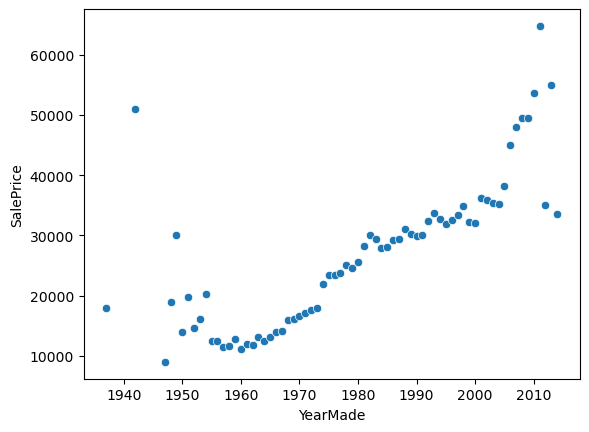

In [11]:
year_made_avg_price = df.groupby('YearMade')['SalePrice'].mean()
sns.scatterplot(data=year_made_avg_price)

Noticing high variance in bulldozers made before 1950.  This could be a vintage niche in the market.  But, from around 1955 onwards, there is a clear linear relationship between the year in whiche the bulldozer was made, and the price it commands at auction.

### Compare mean `SalePrice` with `ProductSize`

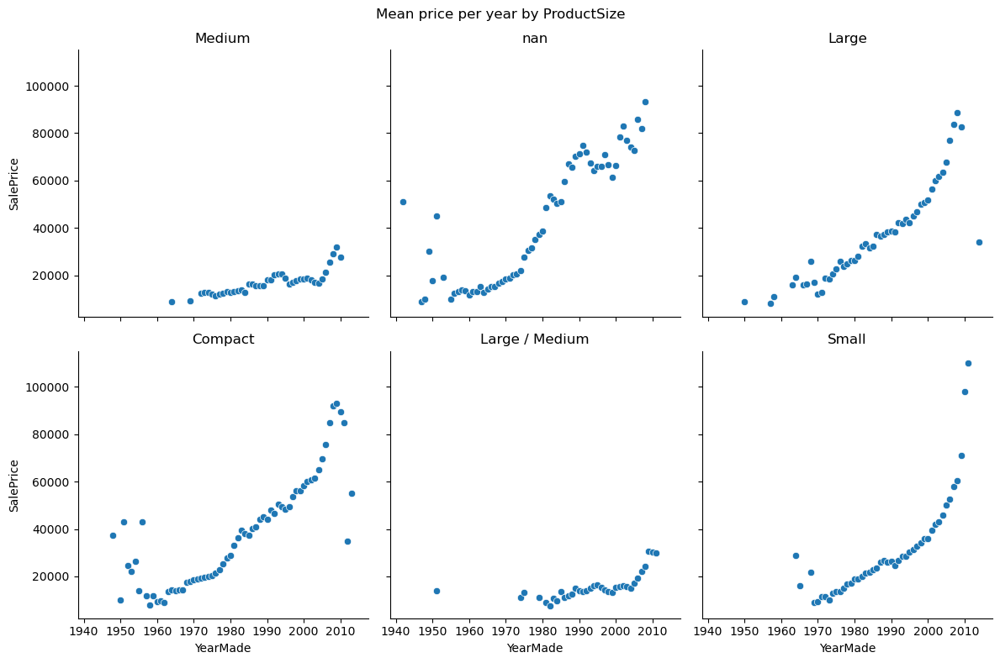

In [12]:
grouped_df = df.groupby(['ProductSize', 'YearMade'])['SalePrice'].mean().reset_index()
num_cols = 3

categories = df['ProductSize'].unique()
num_categories = len(categories)
num_rows = (num_categories + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create the facet grid
grid = sns.FacetGrid(grouped_df, col='ProductSize', col_wrap=num_cols, height=4)

# Map scatter plots to the facet grid
grid.map(sns.scatterplot, 'YearMade', 'SalePrice')

# Set title for figure
grid.fig.suptitle('Mean price per year by ProductSize')

# Set titles for each subplot
for ax, category in zip(grid.axes, categories):
    ax.set_title(category)

# Adjust the layout and display the grid of scatter plots
plt.tight_layout()
plt.show()

### Outliers

As outliers can have a severe effect on predictions, we should get a sense of the amount and severity of outliers in this data set.

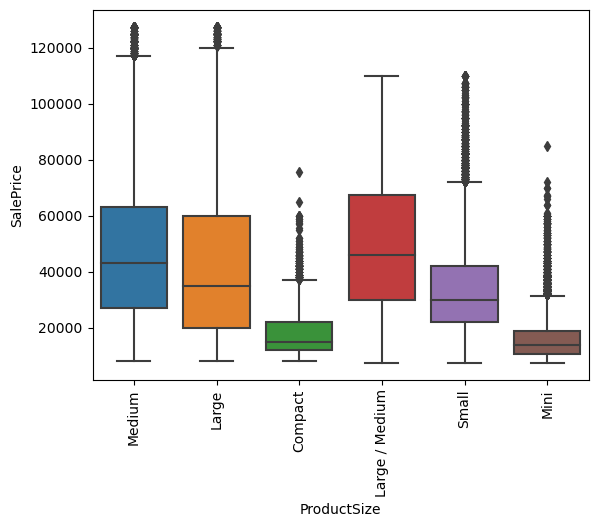

In [20]:
_ = sns.boxplot(x='ProductSize', y='SalePrice', data=df)
_.set_xticklabels(_.get_xticklabels(),rotation=90)
_ = plt.xlabel('ProductSize')
_ = plt.ylabel('SalePrice')
plt.show()

It seems we have quite a few outliers, relative to the `ProductSize`.

Let's get a sense of these outliers as a percentage of the entire feature:

In [22]:
Q1 = df['SalePrice'].quantile(0.25)
Q3 = df['SalePrice'].quantile(0.75)
IQR = Q3 - Q1

outliers = df[(df['SalePrice'] < (Q1 - 1.5 * IQR)) | (df['SalePrice'] > (Q3 + 1.5 * IQR))]

outlier_percentage = len(outliers) / len(df) * 100
outlier_percentage

5.023396752611185

~5% is not insignificant. 

I feel we have two options:

1: As tree-based algorithms such as Decision Trees, Random Forest, and Gradient Boosting are generally considered to be more robust to outliers than many other machine learning algorithms, we can keep the outliers in our dataset, and use a decision tree.

2: Trim the outliers, and use a regression model.

I think we should go with option 1 for now, see how our model performs, then we can iterate, come back, and revisit this issue to see if option 2 is superior.

### Visualize `NaN` values

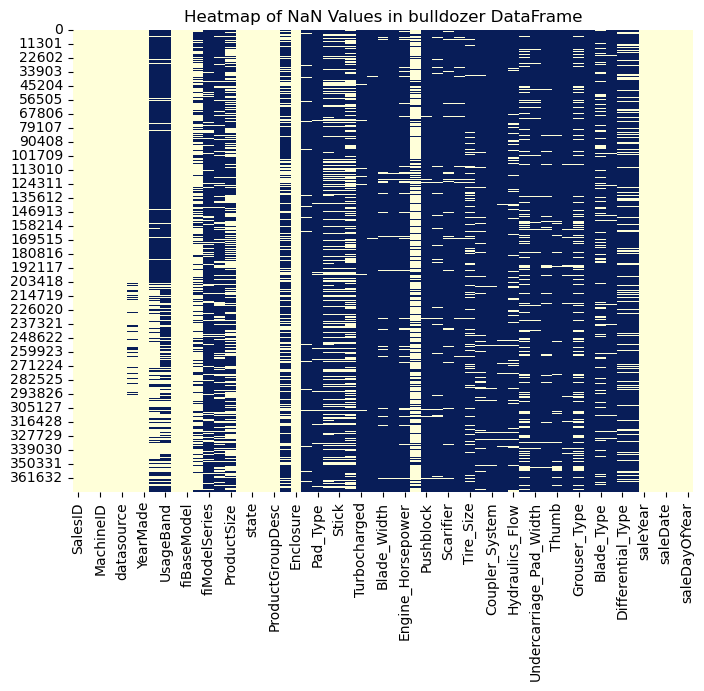

In [17]:
plt.figure(figsize=(8, 6))
sns.heatmap(df.isnull(), cmap='YlGnBu', cbar=False)
plt.title('Heatmap of NaN Values in bulldozer DataFrame')
plt.show()

It appears we have a substantial amount of `NaN` values, particularly for categorical values.  Will will have to handle for this by turning the string / `NaN` values into category codes.

### Generate Automated Pandas Profiling Report

Let's generate a report, which may expose some insights we could have missed.

In [23]:
profile = ProfileReport(df, title="Bluebook for bulldozers")
profile.to_file("../reports/bulldozer_profiling.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/gregmckenzie/opt/anaconda3/lib/python3.9/site-packages/pandas_profiling/model/correlations.py:67: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
df.to_csv('../data/processed/exploratory-data-analysis.csv', index=False)